# Import library

In [11]:
import os
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import random as rn
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

In [2]:
# Lấy ra các loại hoa có trong folder flower
list_flower = os.listdir('flowers')
list_flower

['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']

# Tạo dữ liệu huấn luyện



In [12]:
# Lấy ra từng loại hoa trong từng folder hoa tương ứng

# Lấy path folder hoa từng loại

img_size = 150

Daisy_path = 'flowers\\daisy'
Dandelion_path = 'flowers\\dandelion'
Rose_path = 'flowers\\rose'
Sunflower_path = 'flowers\\sunflower'
Tulip_path = 'flowers\\tulip'


# Lấy ra từng ảnh loại hoa

X_array_img = [] # Danh sách ma trận điểm ảnh
Z_label_img = [] # Danh sách chưa nhãn của ảnh

# Gắn  từng nhãn tương ứng ảnh loại hoa

def assign_label(img, flower_type): #img: ảnh đầu vào, flower_type: Tên loại hoa
    return flower_type

def make_train_test_data_img(flower_type, path_folder_flower):
    X_type_flower = []
    Y_type_flower = []
    for img in os.listdir(path_folder_flower):
        #Lấy ra các tên loại hoa flower_type, img ảnh có ở file
        label = assign_label(img, flower_type)
        
        # Hàm này được sử dụng để nối các đường dẫn tệp tin hoặc thư mục với nhau. 
        # Ví dụ, nếu bạn muốn nối đường dẫn tệp tin img.jpg
        path = os.path.join(path_folder_flower, img) # trả về đường dẫn file của từng folder hoa.
        img = cv2.imread(path, cv2.IMREAD_COLOR) # Đọc ảnh
        img = cv2.resize(img, (128,128)) #Chỉnh kích thước cho cùng nhau
        
        X_array_img.append(np.array(img)) # Lấy ma trận các điểm ảnh
        Z_label_img.append(str(label)) # Lấy ra tên loại hoa tương ứng với ảnh
        
        X_type_flower.append(np.array(img)) # Lấy ma trận các điểm ảnh
        Y_type_flower.append(str(label))
    print('Số lượng loại hoa', flower_type, 'huấn luyện là: ', len(X_type_flower))

# Lấy ra số lượng hoa từng loại
make_train_test_data_img('daisy',Daisy_path)
make_train_test_data_img('dandelion',Dandelion_path)
make_train_test_data_img('rose',Rose_path)
make_train_test_data_img('sunflower',Sunflower_path)
make_train_test_data_img('tulip',Tulip_path)

print('Tổng số lượng các loại hoa huấn luyện: ', len(X_array_img))
print('Nhãn hoa của từng ảnh huấn luyện: ',Z_label_img)

# Dữ liệu ma trận Huấn luyện (one-hot)
le = LabelEncoder() # Mã hóa các loại hoa và chuyển đổi chúng thành các số nguyên (nếu Daisy xuất hiện:1, các vị trí còn lại = 0)
Y = le.fit_transform(Z_label_img) # Đưa về dạng số nguyên # quy ước: 0: daisy, 1: dandelion, 2: rose, 3: sunflower, 4: tulip  [0 0 0 ... 4 4 4]
Y = to_categorical(Y, 5) # Phân ra 5 loại hoa -> đưa Y ở trên về dạng vecto [x, x, x, x, x]: vd ảnh 1 là Daisy  thì ma trận [1,0,0,0,0]  index(1) = 0->daisy
# đưa về dạng ma trận so sánh 5 gt xác suất của các loại hoa
X = np.array(X_array_img) # ma trận điểm ảnh của từng ảnh
X = X/255 # Giảm độ lớn giá trị ma trận  mỗi kênh màu R,G,B sẽ sử dụng 8bit để biểu diễn, tức là giá trị R, G, B nằm trong khoảng 0 - 255
# ảnh dạng trắng đen.
#X: data đầu vào
#Y: nhãn label
print('Đầu vào huấn luyện: ', X)
print('Nhãn huấn luyện: ', Y)

Số lượng loại hoa daisy huấn luyện là:  408
Số lượng loại hoa dandelion huấn luyện là:  808
Số lượng loại hoa rose huấn luyện là:  568
Số lượng loại hoa sunflower huấn luyện là:  552
Số lượng loại hoa tulip huấn luyện là:  848
Tổng số lượng các loại hoa huấn luyện:  3184
Nhãn hoa của từng ảnh huấn luyện:  ['daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy',

# Tạo dữ liệu kiểm thử

In [14]:
# Lấy ra từng loại hoa trong từng folder hoa tương ứng

# Lấy path folder hoa từng loại

img_size = 150

Daisy_test_path = 'flowers_test\\daisy'
Dandelion_test_path = 'flowers_test\\dandelion'
Rose_test_path = 'flowers_test\\rose'
Sunflower_test_path = 'flowers_test\\sunflower'
Tulip_test_path = 'flowers_test\\tulip'


# Lấy ra từng ảnh loại hoa

X_test_array_img = [] # Danh sách ma trận điểm ảnh
Z_test_label_img = [] # Danh sách chưa nhãn của ảnh

# Gắn  từng nhãn tương ứng ảnh loại hoa

def assign_label(img, flower_type): #img: ảnh đầu vào, flower_type: Tên loại hoa
    return flower_type

def make_train_test_data_img(flower_type, path_folder_flower):
    X_type_flower = []
    Y_type_flower = []
    for img in os.listdir(path_folder_flower):
        #Lấy ra các tên loại hoa flower_type, img ảnh có ở file
        label = assign_label(img, flower_type)
        
        # Hàm này được sử dụng để nối các đường dẫn tệp tin hoặc thư mục với nhau. 
        # Ví dụ, nếu bạn muốn nối đường dẫn tệp tin img.jpg
        path = os.path.join(path_folder_flower, img) # trả về đường dẫn file của từng folder hoa.
        img = cv2.imread(path, cv2.IMREAD_COLOR) # Đọc ảnh
        img = cv2.resize(img, (128,128)) #Chỉnh kích thước cho cùng nhau
        
        X_test_array_img.append(np.array(img)) # Lấy ma trận các điểm ảnh
        Z_test_label_img.append(str(label)) # Lấy ra tên loại hoa tương ứng với ảnh
        
        X_type_flower.append(np.array(img)) # Lấy ma trận các điểm ảnh
        Y_type_flower.append(str(label))
    print('Số lượng loại hoa', flower_type, 'kiểm thử là: ', len(X_type_flower))

# Lấy ra số lượng hoa từng loại
make_train_test_data_img('daisy',Daisy_test_path)
make_train_test_data_img('dandelion',Dandelion_test_path)
make_train_test_data_img('rose',Rose_test_path)
make_train_test_data_img('sunflower',Sunflower_test_path)
make_train_test_data_img('tulip',Tulip_test_path)

print('Tổng số lượng các loại hoa kiểm thử: ', len(X_test_array_img))
print('Nhãn hoa của từng ảnh kiểm thử: ',Z_test_label_img)

# Dữ liệu ma trận Kiểm thử (one-hot)
le = LabelEncoder() # Mã hóa các loại hoa và chuyển đổi chúng thành các số nguyên (nếu Daisy xuất hiện:1, các vị trí còn lại = 0)
Y_test = le.fit_transform(Z_test_label_img) # Đưa về dạng số nguyên # quy ước: 0: daisy, 1: dandelion, 2: rose, 3: sunflower, 4: tulip  [0 0 0 ... 4 4 4]
Y_test = to_categorical(Y_test, 5) # Phân ra 5 loại hoa -> đưa Y_test ở trên về dạng vecto [x, x, x, x, x]: vd ảnh 1 là Daisy  thì ma trận [1,0,0,0,0]  index(1) = 0->daisy
# đưa về dạng ma trận so sánh 5 gt xác suất của các loại hoa
X_test = np.array(X_test_array_img) # ma trận điểm ảnh của từng ảnh
X_test = X_test/255 # Giảm độ lớn giá trị ma trận  mỗi kênh màu R,G,B sẽ sử dụng 8bit để biểu diễn, tức là giá trị R, G, B nằm trong khoảng 0 - 255
# ảnh dạng trắng đen.
#X_test: data đầu vào
#Y_test: nhãn label
print('Đầu vào kiểm thử: ', X_test)
print('Nhãn kiểm thử: ', Y_test)

Số lượng loại hoa daisy kiểm thử là:  356
Số lượng loại hoa dandelion kiểm thử là:  244
Số lượng loại hoa rose kiểm thử là:  216
Số lượng loại hoa sunflower kiểm thử là:  181
Số lượng loại hoa tulip kiểm thử là:  136
Tổng số lượng các loại hoa kiểm thử:  1133
Nhãn hoa của từng ảnh kiểm thử:  ['daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'dai

# Tạo dữ liệu hình thực tế

In [203]:
# Lấy ra từng loại hoa trong từng folder hoa tương ứng

# Lấy path folder hoa từng loại

img_size = 150

Daisy_path_real = 'flower_real\\daisy'
Dandelion_path_real = 'flower_real\\dandelion'
Rose_path_real = 'flower_real\\rose'
Sunflower_path_real = 'flower_real\\sunflower'
Tulip_path_real = 'flower_real\\tulip'


# Lấy ra từng ảnh loại hoa

X_real_array_img = [] # Danh sách ma trận điểm ảnh
Z_real_label_img = [] # Danh sách chưa nhãn của ảnh

# Gắn  từng nhãn tương ứng ảnh loại hoa

def assign_label(img, flower_type): #img: ảnh đầu vào, flower_type: Tên loại hoa
    return flower_type

def make_train_test_data_img(flower_type, path_folder_flower):
    X_type_flower = []
    Y_type_flower = []
    for img in os.listdir(path_folder_flower):
        #Lấy ra các tên loại hoa flower_type, img ảnh có ở file
        label = assign_label(img, flower_type)
        
        # Hàm này được sử dụng để nối các đường dẫn tệp tin hoặc thư mục với nhau. 
        # Ví dụ, nếu bạn muốn nối đường dẫn tệp tin img.jpg
        path = os.path.join(path_folder_flower, img) # trả về đường dẫn file của từng folder hoa.
        img = cv2.imread(path, cv2.IMREAD_COLOR) # Đọc ảnh
        img = cv2.resize(img, (128,128)) #Chỉnh kích thước cho cùng nhau
        
        X_real_array_img.append(np.array(img)) # Lấy ma trận các điểm ảnh
        Z_real_label_img.append(str(label)) # Lấy ra tên loại hoa tương ứng với ảnh
        
        X_type_flower.append(np.array(img)) # Lấy ma trận các điểm ảnh
        Y_type_flower.append(str(label))
    print('Số lượng loại hoa', flower_type, 'thực tế là: ', len(X_type_flower))

# Lấy ra số lượng hoa từng loại
make_train_test_data_img('daisy',Daisy_path_real)
make_train_test_data_img('dandelion',Dandelion_path_real)
make_train_test_data_img('rose',Rose_path_real)
make_train_test_data_img('sunflower',Sunflower_path_real)
make_train_test_data_img('tulip',Tulip_path_real)

print('Tổng số lượng các loại hoa thực tế: ', len(X_real_array_img))
print('Nhãn hoa của từng ảnh thực tế: ',Z_real_label_img)

# Dữ liệu ma trận Huấn luyện (one-hot)
le = LabelEncoder() # Mã hóa các loại hoa và chuyển đổi chúng thành các số nguyên (nếu Daisy xuất hiện:1, các vị trí còn lại = 0)
Y_real = le.fit_transform(Z_real_label_img) # Đưa về dạng số nguyên # quy ước: 0: daisy, 1: dandelion, 2: rose, 3: sunflower, 4: tulip  [0 0 0 ... 4 4 4]
Y_real = to_categorical(Y_real, 5) # Phân ra 5 loại hoa -> đưa Y ở trên về dạng vecto [x, x, x, x, x]: vd ảnh 1 là Daisy  thì ma trận [1,0,0,0,0]  index(1) = 0->daisy
# đưa về dạng ma trận so sánh 5 gt xác suất của các loại hoa
X_real = np.array(X_real_array_img) # ma trận điểm ảnh của từng ảnh
X_real = X_real/255 # Giảm độ lớn giá trị ma trận  mỗi kênh màu R,G,B sẽ sử dụng 8bit để biểu diễn, tức là giá trị R, G, B nằm trong khoảng 0 - 255
# ảnh dạng trắng đen.
#X: data đầu vào
#Y: nhãn label
print('Đầu vào thực tế: ', X_real)
print('Nhãn thực tế: ', Y_real)

Số lượng loại hoa daisy thực tế là:  20
Số lượng loại hoa dandelion thực tế là:  20
Số lượng loại hoa rose thực tế là:  20
Số lượng loại hoa sunflower thực tế là:  20
Số lượng loại hoa tulip thực tế là:  20
Tổng số lượng các loại hoa thực tế:  100
Nhãn hoa của từng ảnh thực tế:  ['daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'daisy', 'dandelion', 'dandelion', 'dandelion', 'dandelion', 'dandelion', 'dandelion', 'dandelion', 'dandelion', 'dandelion', 'dandelion', 'dandelion', 'dandelion', 'dandelion', 'dandelion', 'dandelion', 'dandelion', 'dandelion', 'dandelion', 'dandelion', 'dandelion', 'rose', 'rose', 'rose', 'rose', 'rose', 'rose', 'rose', 'rose', 'rose', 'rose', 'rose', 'rose', 'rose', 'rose', 'rose', 'rose', 'rose', 'rose', 'rose', 'rose', 'sunflower', 'sunflower', 'sunflower', 'sunflower', 'sunflower', 'sunflower', 'sunflower', 'sunflower', 'sunflower', 's

# Model

In [16]:
from keras import backend as K
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam


# specifically for cnn
from keras.layers import Flatten,Activation
from keras.layers import Conv2D, MaxPooling2D, Dropout

giải thích lớp FLatten
Thao tác làm phẳng trên tensor định hình lại tensor để có hình dạng bằng với số phần tử có trong tensor không bao gồm kích thước lô .
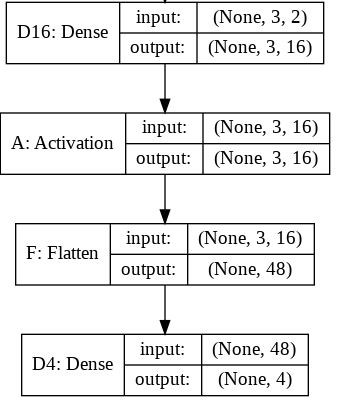

# Mô hình CNN
Chạy thử từng epoch 1-20

In [27]:
dict_epoch_val_accuracy = {}
for epoch in range (1,21):
    model = Sequential()

    # add layer
    model.add(Conv2D(filters= 32, kernel_size=(3,3), input_shape = (128,128,3))) # kích thước 128-128 với số kênh màu =3 #32 bộ lọc, kích thước 1 bộ lọc (5x5)
    model.add(MaxPooling2D(pool_size=(2,2)))

    model.add(Conv2D(filters = 64, kernel_size = (3,3)))
    model.add(MaxPooling2D(pool_size=(4,4)))


    model.add(Conv2D(filters = 64, kernel_size = (3,3)))
    model.add(MaxPooling2D(pool_size=(4,4)))

    model.add(Flatten())
    # Fully connected

    model.add(Dense(512)) # fully connected lớp kết nối đầy đủ
    model.add(Activation('sigmoid'))
    model.add(Dropout(0.5))
    model.add(Dense(5, activation = "softmax")) # Output layer

    # thông số
    model.compile(optimizer=Adam(lr=0.001),loss='categorical_crossentropy',metrics=['accuracy']) #lr: kearning rate = 0.001
    # categorical_crossentropy: một hàm mất mát được sử dụng trong các bài toán phân loại đa lớp, đầu ra được mã hóa dưới dạng one-hot vector

    model.summary() # Tổng hợp mô hình


    History = model.fit(X, Y, batch_size = 40, epochs=epoch, validation_data=(X_test, Y_test)) # số lượng mẫu 1 batch_size = 40, 
    # thực hiện kiểm thử trên dữ liệu test luôn: validation_data: kết quả của việc kiểm tra lại các dữ liệu đã học
    dict_epoch_val_accuracy[epoch] = History.history['val_accuracy']
print('Val_accuracy từng epoch là: ', dict_epoch_val_accuracy)


Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_57 (Conv2D)          (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_57 (MaxPooli  (None, 63, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_58 (Conv2D)          (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_58 (MaxPooli  (None, 15, 15, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_59 (Conv2D)          (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_59 (MaxPooli  (None, 3, 3, 64)        

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_60 (Conv2D)          (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_60 (MaxPooli  (None, 63, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_61 (Conv2D)          (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_61 (MaxPooli  (None, 15, 15, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_62 (Conv2D)          (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_62 (MaxPooli  (None, 3, 3, 64)        

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_63 (Conv2D)          (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_63 (MaxPooli  (None, 63, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_64 (Conv2D)          (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_64 (MaxPooli  (None, 15, 15, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_65 (Conv2D)          (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_65 (MaxPooli  (None, 3, 3, 64)        

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_66 (Conv2D)          (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_66 (MaxPooli  (None, 63, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_67 (Conv2D)          (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_67 (MaxPooli  (None, 15, 15, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_68 (Conv2D)          (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_68 (MaxPooli  (None, 3, 3, 64)        

Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_69 (Conv2D)          (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_69 (MaxPooli  (None, 63, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_70 (Conv2D)          (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_70 (MaxPooli  (None, 15, 15, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_71 (Conv2D)          (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_71 (MaxPooli  (None, 3, 3, 64)        

Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_72 (Conv2D)          (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_72 (MaxPooli  (None, 63, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_73 (Conv2D)          (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_73 (MaxPooli  (None, 15, 15, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_74 (Conv2D)          (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_74 (MaxPooli  (None, 3, 3, 64)        

Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_75 (Conv2D)          (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_75 (MaxPooli  (None, 63, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_76 (Conv2D)          (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_76 (MaxPooli  (None, 15, 15, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_77 (Conv2D)          (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_77 (MaxPooli  (None, 3, 3, 64)        

Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_78 (Conv2D)          (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_78 (MaxPooli  (None, 63, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_79 (Conv2D)          (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_79 (MaxPooli  (None, 15, 15, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_80 (Conv2D)          (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_80 (MaxPooli  (None, 3, 3, 64)        

Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_81 (Conv2D)          (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_81 (MaxPooli  (None, 63, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_82 (Conv2D)          (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_82 (MaxPooli  (None, 15, 15, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_83 (Conv2D)          (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_83 (MaxPooli  (None, 3, 3, 64)        

Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_84 (Conv2D)          (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_84 (MaxPooli  (None, 63, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_85 (Conv2D)          (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_85 (MaxPooli  (None, 15, 15, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_86 (Conv2D)          (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_86 (MaxPooli  (None, 3, 3, 64)        

Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_87 (Conv2D)          (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_87 (MaxPooli  (None, 63, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_88 (Conv2D)          (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_88 (MaxPooli  (None, 15, 15, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_89 (Conv2D)          (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_89 (MaxPooli  (None, 3, 3, 64)        

Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_90 (Conv2D)          (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_90 (MaxPooli  (None, 63, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_91 (Conv2D)          (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_91 (MaxPooli  (None, 15, 15, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_92 (Conv2D)          (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_92 (MaxPooli  (None, 3, 3, 64)        

Model: "sequential_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_93 (Conv2D)          (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_93 (MaxPooli  (None, 63, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_94 (Conv2D)          (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_94 (MaxPooli  (None, 15, 15, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_95 (Conv2D)          (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_95 (MaxPooli  (None, 3, 3, 64)        

Model: "sequential_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_96 (Conv2D)          (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_96 (MaxPooli  (None, 63, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_97 (Conv2D)          (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_97 (MaxPooli  (None, 15, 15, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_98 (Conv2D)          (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_98 (MaxPooli  (None, 3, 3, 64)        

Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_99 (Conv2D)          (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_99 (MaxPooli  (None, 63, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_100 (Conv2D)         (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_100 (MaxPool  (None, 15, 15, 64)        0         
 ing2D)                                                          
                                                                 
 conv2d_101 (Conv2D)         (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_101 (MaxPool  (None, 3, 3, 64)        

Model: "sequential_34"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_102 (Conv2D)         (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_102 (MaxPool  (None, 63, 63, 32)        0         
 ing2D)                                                          
                                                                 
 conv2d_103 (Conv2D)         (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_103 (MaxPool  (None, 15, 15, 64)        0         
 ing2D)                                                          
                                                                 
 conv2d_104 (Conv2D)         (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_104 (MaxPool  (None, 3, 3, 64)        

Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_105 (Conv2D)         (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_105 (MaxPool  (None, 63, 63, 32)        0         
 ing2D)                                                          
                                                                 
 conv2d_106 (Conv2D)         (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_106 (MaxPool  (None, 15, 15, 64)        0         
 ing2D)                                                          
                                                                 
 conv2d_107 (Conv2D)         (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_107 (MaxPool  (None, 3, 3, 64)        

Model: "sequential_36"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_108 (Conv2D)         (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_108 (MaxPool  (None, 63, 63, 32)        0         
 ing2D)                                                          
                                                                 
 conv2d_109 (Conv2D)         (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_109 (MaxPool  (None, 15, 15, 64)        0         
 ing2D)                                                          
                                                                 
 conv2d_110 (Conv2D)         (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_110 (MaxPool  (None, 3, 3, 64)        

Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_111 (Conv2D)         (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_111 (MaxPool  (None, 63, 63, 32)        0         
 ing2D)                                                          
                                                                 
 conv2d_112 (Conv2D)         (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_112 (MaxPool  (None, 15, 15, 64)        0         
 ing2D)                                                          
                                                                 
 conv2d_113 (Conv2D)         (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_113 (MaxPool  (None, 3, 3, 64)        

Model: "sequential_38"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_114 (Conv2D)         (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_114 (MaxPool  (None, 63, 63, 32)        0         
 ing2D)                                                          
                                                                 
 conv2d_115 (Conv2D)         (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_115 (MaxPool  (None, 15, 15, 64)        0         
 ing2D)                                                          
                                                                 
 conv2d_116 (Conv2D)         (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_116 (MaxPool  (None, 3, 3, 64)        

In [34]:
print('Độ chính xác trên tệp kiểm thử (Val_accuracy):\n ',History.history['val_accuracy'])
print('Độ chính xác lớn nhất của kiểm thử (Val_accuracy): ',max(History.history['val_accuracy']))
print('Epoch có Độ chính xác lớn nhất của kiểm thử (Val_accuracy): ',History.history['val_accuracy'].index(max(History.history['val_accuracy'])))

Độ chính xác trên tệp kiểm thử (Val_accuracy):
  [0.5330979824066162, 0.5948808193206787, 0.5957634449005127, 0.5710502862930298, 0.6257722973823547, 0.6310679316520691, 0.633715808391571, 0.6646072268486023, 0.6125330924987793, 0.685789942741394, 0.658428966999054, 0.6425419449806213, 0.6690202951431274, 0.6875551342964172, 0.6619594097137451, 0.6716681122779846, 0.658428966999054, 0.6504854559898376, 0.6496028304100037, 0.6601941585540771]
Độ chính xác lớn nhất của kiểm thử (Val_accuracy):  0.6875551342964172
Epoch có Độ chính xác lớn nhất của kiểm thử (Val_accuracy):  13


# Epoch Max = 13
Sau 20 lần chạy epoch, mô hình sử dụng epoch = 13 có giá trị validation accuracy lớn nhất


In [35]:
epoch = 13

model = Sequential()
# add layer
model.add(Conv2D(filters= 32, kernel_size=(3,3), input_shape = (128,128,3))) # kích thước 128-128 với số kênh màu =3 #32 bộ lọc, kích thước 1 bộ lọc (5x5)
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(filters = 64, kernel_size = (3,3)))
model.add(MaxPooling2D(pool_size=(4,4)))


model.add(Conv2D(filters = 64, kernel_size = (3,3)))
model.add(MaxPooling2D(pool_size=(4,4)))

model.add(Flatten())
# Fully connected

model.add(Dense(512)) # fully connected lớp kết nối đầy đủ
model.add(Activation('sigmoid'))
model.add(Dropout(0.5))
model.add(Dense(5, activation = "softmax")) # Output layer

# thông số
model.compile(optimizer=Adam(lr=0.001),loss='categorical_crossentropy',metrics=['accuracy']) #lr: kearning rate = 0.001
# categorical_crossentropy: một hàm mất mát được sử dụng trong các bài toán phân loại đa lớp, đầu ra được mã hóa dưới dạng one-hot vector

model.summary() # Tổng hợp mô hình


History = model.fit(X, Y, batch_size = 40, epochs=epoch, validation_data=(X_test, Y_test)) # số lượng mẫu 1 batch_size = 40, 

Model: "sequential_39"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_117 (Conv2D)         (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_117 (MaxPool  (None, 63, 63, 32)        0         
 ing2D)                                                          
                                                                 
 conv2d_118 (Conv2D)         (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_118 (MaxPool  (None, 15, 15, 64)        0         
 ing2D)                                                          
                                                                 
 conv2d_119 (Conv2D)         (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_119 (MaxPool  (None, 3, 3, 64)        

# Kết quả các trọng số sau khi huấn luyện


In [222]:
model.summary()

Model: "sequential_39"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_117 (Conv2D)         (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_117 (MaxPool  (None, 63, 63, 32)        0         
 ing2D)                                                          
                                                                 
 conv2d_118 (Conv2D)         (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_118 (MaxPool  (None, 15, 15, 64)        0         
 ing2D)                                                          
                                                                 
 conv2d_119 (Conv2D)         (None, 13, 13, 64)        36928     
                                                                 
 max_pooling2d_119 (MaxPool  (None, 3, 3, 64)        

Trọng số lớp cuối cùng

In [236]:
list_weight = model.layers[-1].get_weights()[0]
print('Số lượng trọng số W sau khi kết thúc huấn luyện: ', len(list_weight))
print('Trọng số W sau khi kết thúc huấn luyện: \n', list_weight)


Số lượng trọng số W sau khi kết thúc huấn luyện:  512
Trọng số W sau khi kết thúc huấn luyện: 
 [[ 0.07486828  0.05325118  0.02664996  0.09491393 -0.1021345 ]
 [-0.04795656  0.09664536 -0.10857406 -0.07116733 -0.03865953]
 [ 0.1027327  -0.06350595  0.01854237  0.11007228 -0.01816643]
 ...
 [ 0.05613979  0.06931303 -0.09455952  0.03020313  0.02284399]
 [ 0.10585991  0.06253138 -0.06084955  0.08379872  0.04629483]
 [ 0.05727984 -0.00354902 -0.03466196 -0.09872358  0.07059223]]


In [198]:
list_bias = model.layers[-1].get_weights()[1]
print('Trọng số bias sau khi kết thúc huấn luyện: ', list_bias)

Trọng số bias sau khi kết thúc huấn luyện:  [ 0.00756133 -0.00109819  0.00348082  0.00126782 -0.00844345]


# Giải thích các thông số:
- loss: 1.2595 - accuracy: 0.4646 - val_loss: 1.0825 - val_accuracy: 0.5861
- loss: giá trị hàm mất mát trên tập huấn luyện.
- accuracy: độ chính xác trên tập huấn luyện.
- val_loss: giá trị hàm mất mát trên tập kiểm tra.
- val_accuracy: độ chính xác trên tập kiểm tra.

# Kiểm thử dữ liệu huấn luyện
100 ảnh tập dữ liệu huấn luyện

# Daisy Train

100/100 [==============================] - 13s 124ms/step


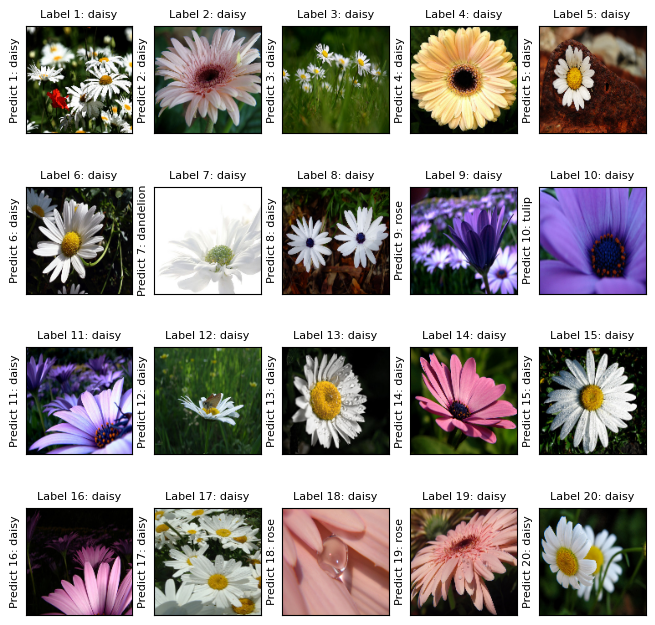

Kết quả dự đoán 20 hình daisy của tệp huấn luyện
Độ chính xác dự đoán hoa Daisy của 20 hình tệp dữ liệu huấn luyện:  75.0 %


In [122]:
import cv2
import matplotlib.pyplot as plt

# Kiểm thử lại với tệp dữ liệu huấn luyện
y_pre = model.predict(X)
predict = np.argmax(y_pre, axis=1) # trả về vị trí có giá trị max - loại hoa tại ảnh đó
flower_predict = []
for i in predict:
    if i == 0:
        flower_predict.append('daisy')
    elif i == 1:
        flower_predict.append('dandelion')
    elif i == 2:
        flower_predict.append('rose')
    elif i == 3:
        flower_predict.append('sunflower')
    elif i == 4:
        flower_predict.append('tulip')

# 20 ảnh daisy
fig = plt.figure(figsize=(8, 8))
columns = 5
rows = 4
index_type = Z_label_img.index('daisy')
Z_label_daisy = Z_label_img[index_type:index_type+20]
y_pre_daisy = []
for i in range(1, columns * rows + 1):
    fig.add_subplot(rows, columns, i)
    img = X_array_img[i+index_type]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('Label {}: {}'.format(i+index_type,Z_label_img[i+index_type]), fontdict={'fontsize':8} )
    plt.xticks([]) # bỏ tọa độ ở 2 trục
    plt.yticks([])
    y_pre_image = flower_predict[index_type+i]
    y_pre_daisy.append(y_pre_image)
    plt.ylabel('Predict {}: {}'.format(i+index_type, y_pre_image), fontdict={'fontsize':8})
plt.show()
print('Kết quả dự đoán 20 hình daisy của tệp huấn luyện')
accuracy_daisy = 0
for i in range (0, len(Z_label_daisy)):
    if Z_label_daisy[i] == y_pre_daisy[i]:
        accuracy_daisy += 1
accuracy_daisy = accuracy_daisy/len(Z_label_daisy)*100

print('Độ chính xác dự đoán hoa Daisy của 20 hình tệp dữ liệu huấn luyện: ', accuracy_daisy, '%')

# Dandelion Train

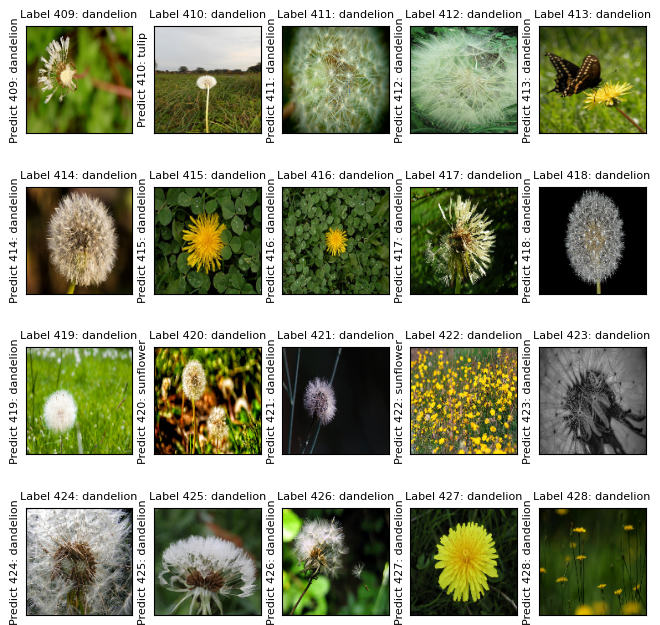

Kết quả dự đoán 20 hình dandelion của tệp huấn luyện
Độ chính xác dự đoán hoa dandelion của 20 hình tệp dữ liệu huấn luyện:  85.0 %


In [229]:
# 20 ảnh dandelion
fig = plt.figure(figsize=(8, 8))
columns = 5
rows = 4
index_type = Z_label_img.index('dandelion')
Z_label_dandelion = Z_label_img[index_type:index_type+20]
y_pre_dandelion = []
for i in range(1, columns * rows + 1):
    fig.add_subplot(rows, columns, i)
    img = X_array_img[i+index_type]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('Label {}: {}'.format(i+index_type,Z_label_img[i+index_type]), fontdict={'fontsize':8} )
    plt.xticks([]) # bỏ tọa độ ở 2 trục
    plt.yticks([])
    y_pre_image = flower_predict[index_type+i]
    y_pre_dandelion.append(y_pre_image)
    plt.ylabel('Predict {}: {}'.format(i+index_type, y_pre_image), fontdict={'fontsize':8})
plt.show()
print('Kết quả dự đoán 20 hình dandelion của tệp huấn luyện')
accuracy_dandelion = 0
for i in range (0, len(Z_label_dandelion)):
    if Z_label_dandelion[i] == y_pre_dandelion[i]:
        accuracy_dandelion += 1
accuracy_dandelion = accuracy_dandelion/len(Z_label_dandelion)*100

print('Độ chính xác dự đoán hoa dandelion của 20 hình tệp dữ liệu huấn luyện: ', accuracy_dandelion, '%')

# Rose Train

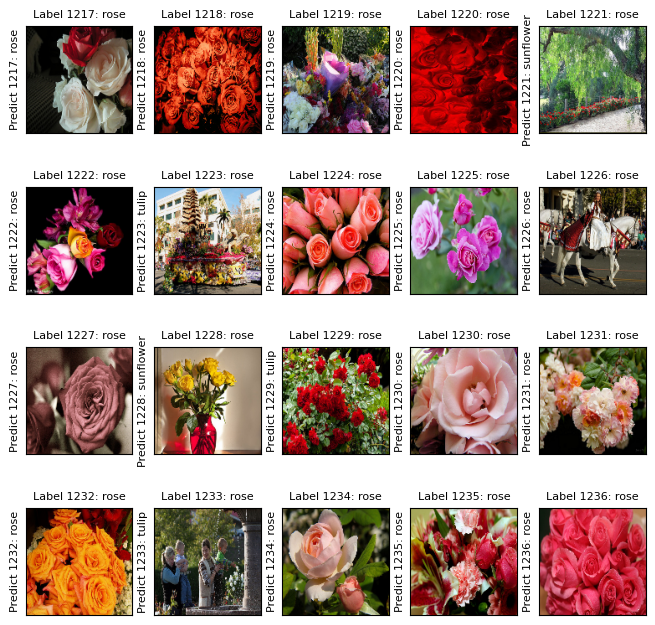

Kết quả dự đoán 20 hình rose của tệp huấn luyện
Độ chính xác dự đoán hoa rose của 20 hình tệp dữ liệu huấn luyện:  75.0 %


In [121]:
# 20 ảnh rose
fig = plt.figure(figsize=(8, 8))
columns = 5
rows = 4
index_type = Z_label_img.index('rose')
Z_label_rose = Z_label_img[index_type:index_type+20]
y_pre_rose = []
for i in range(1, columns * rows + 1):
    fig.add_subplot(rows, columns, i)
    img = X_array_img[i+index_type]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('Label {}: {}'.format(i+index_type,Z_label_img[i+index_type]), fontdict={'fontsize':8} )
    plt.xticks([]) # bỏ tọa độ ở 2 trục
    plt.yticks([])
    y_pre_image = flower_predict[index_type+i]
    y_pre_rose.append(y_pre_image)
    plt.ylabel('Predict {}: {}'.format(i+index_type, y_pre_image), fontdict={'fontsize':8})
plt.show()
print('Kết quả dự đoán 20 hình rose của tệp huấn luyện')
accuracy_rose = 0
for i in range (0, len(Z_label_rose)):
    if Z_label_rose[i] == y_pre_rose[i]:
        accuracy_rose += 1
accuracy_rose = accuracy_rose/len(Z_label_rose)*100

print('Độ chính xác dự đoán hoa rose của 20 hình tệp dữ liệu huấn luyện: ', accuracy_rose, '%')

# Sunflower Train

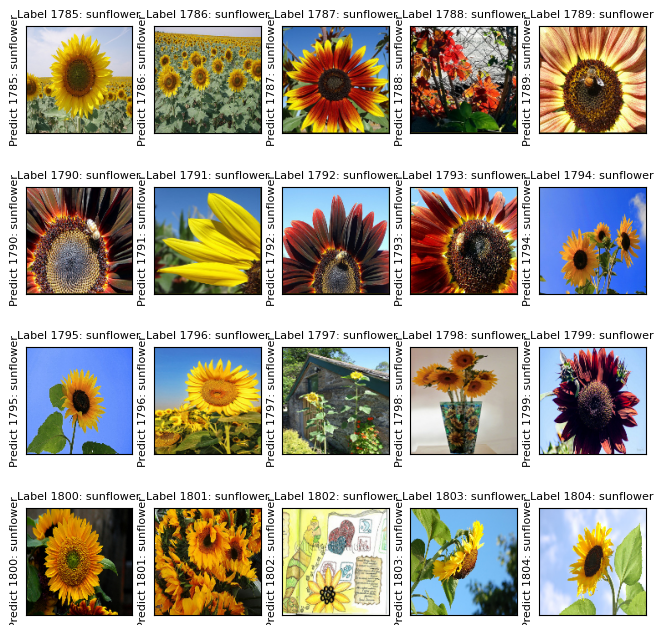

Kết quả dự đoán 20 hình sunflower của tệp huấn luyện
Độ chính xác dự đoán hoa sunflower của 20 hình tệp dữ liệu huấn luyện:  100.0 %


In [120]:
# 20 ảnh sunflower
fig = plt.figure(figsize=(8, 8))
columns = 5
rows = 4
index_type = Z_label_img.index('sunflower')
Z_label_sun = Z_label_img[index_type:index_type+20]
y_pre_sun = []
for i in range(1, columns * rows + 1):
    fig.add_subplot(rows, columns, i)
    img = X_array_img[i+index_type]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('Label {}: {}'.format(i+index_type,Z_label_img[i+index_type]), fontdict={'fontsize':8} )
    plt.xticks([]) # bỏ tọa độ ở 2 trục
    plt.yticks([])
    y_pre_image = flower_predict[index_type+i]
    y_pre_sun.append(y_pre_image)
    plt.ylabel('Predict {}: {}'.format(i+index_type, y_pre_image), fontdict={'fontsize':8})
plt.show()
print('Kết quả dự đoán 20 hình sunflower của tệp huấn luyện')
accuracy_sun = 0
for i in range (0, len(Z_label_sun)):
    if Z_label_sun[i] == y_pre_sun[i]:
        accuracy_sun += 1
accuracy_sun = accuracy_sun/len(Z_label_sun)*100

print('Độ chính xác dự đoán hoa sunflower của 20 hình tệp dữ liệu huấn luyện: ', accuracy_sun, '%')

# Tulip Train

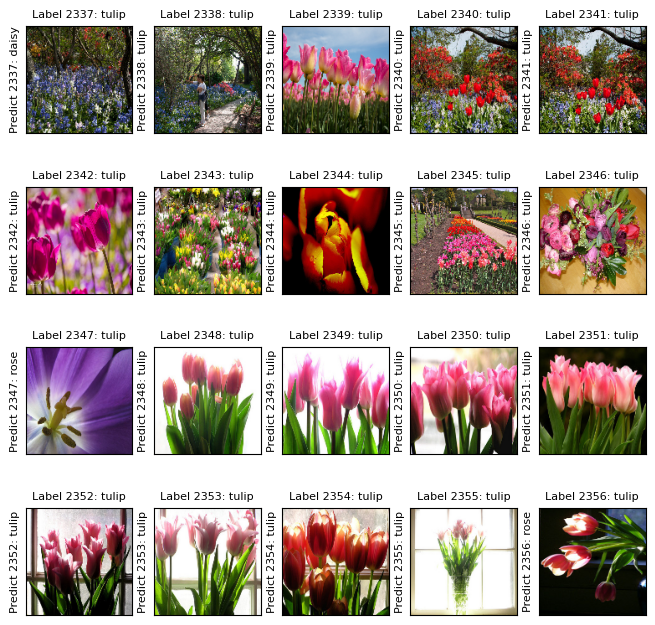

Kết quả dự đoán 20 hình tulip của tệp huấn luyện
Độ chính xác dự đoán hoa tulip của 20 hình tệp dữ liệu huấn luyện:  85.0 %


In [119]:
# 20 ảnh tulip
fig = plt.figure(figsize=(8, 8))
columns = 5
rows = 4
index_type = Z_label_img.index('tulip')
Z_label_tu = Z_label_img[index_type:index_type+20]
y_pre_tu = []
for i in range(1, columns * rows + 1):
    fig.add_subplot(rows, columns, i)
    img = X_array_img[i+index_type]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('Label {}: {}'.format(i+index_type,Z_label_img[i+index_type]), fontdict={'fontsize':8} )
    plt.xticks([]) # bỏ tọa độ ở 2 trục
    plt.yticks([])
    y_pre_image = flower_predict[index_type+i]
    y_pre_tu.append(y_pre_image)
    plt.ylabel('Predict {}: {}'.format(i+index_type, y_pre_image), fontdict={'fontsize':8})
plt.show()
print('Kết quả dự đoán 20 hình tulip của tệp huấn luyện')
accuracy_tu = 0
for i in range (0, len(Z_label_tu)):
    if Z_label_tu[i] == y_pre_tu[i]:
        accuracy_tu += 1
accuracy_tu = accuracy_tu/len(Z_label_tu)*100

print('Độ chính xác dự đoán hoa tulip của 20 hình tệp dữ liệu huấn luyện: ', accuracy_tu, '%')

# Kiểm thử dữ liệu kiểm thử

# Daisy Test

36/36 [==============================] - 7s 178ms/step


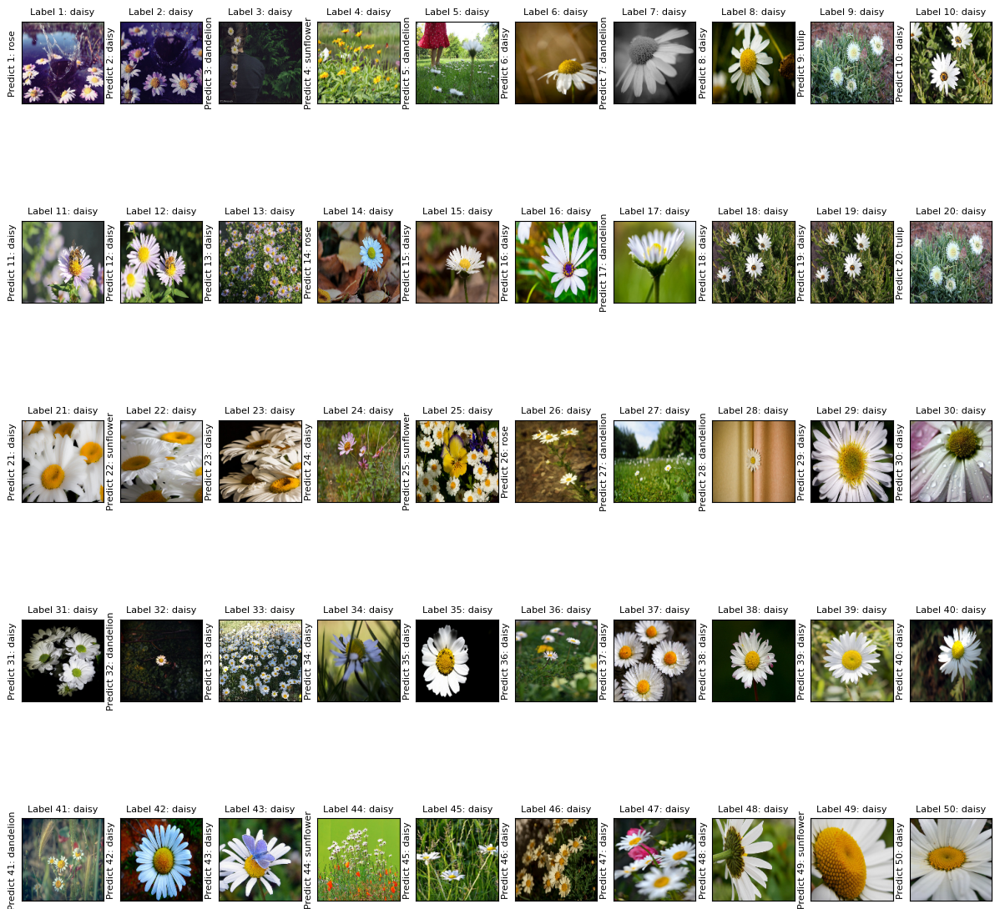

Kết quả dự đoán 50 hình daisy của tệp kiểm thử
Độ chính xác dự đoán hoa daisy của 50 hình tệp dữ liệu kiểm thử:  64.0 %


In [223]:
import cv2
import matplotlib.pyplot as plt

# Kiểm thử lại với tệp dữ liệu huấn luyện
y_pre_test = model.predict(X_test)
predict_test = np.argmax(y_pre_test, axis=1) # trả về vị trí có giá trị max - loại hoa tại ảnh đó
# y_test
flower_pre_test = []
for i in predict_test:
    if i == 0:
        flower_pre_test.append('daisy')
    elif i == 1:
        flower_pre_test.append('dandelion')
    elif i == 2:
        flower_pre_test.append('rose')
    elif i == 3:
        flower_pre_test.append('sunflower')
    else:
        flower_pre_test.append('tulip')
flower_pre_test

# 50 ảnh daisy
fig = plt.figure(figsize=(15, 15))
columns = 10
rows = 5
index_type = Z_test_label_img.index('daisy')
Z_test_label_daisy = Z_test_label_img[index_type:index_type + 50]
y_pre_test_daisy = []
for i in range(1, columns * rows + 1):
    fig.add_subplot(rows, columns, i)
    img = X_test_array_img[i+index_type]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('Label {}: {}'.format(i+index_type, Z_test_label_img[i+index_type]), fontdict={'fontsize':8} )
    plt.xticks([]) # bỏ tọa độ ở 2 trục
    plt.yticks([])
    y_pre_test_image = flower_pre_test[index_type+i]
    y_pre_test_daisy.append(y_pre_test_image)
    plt.ylabel('Predict {}: {}'.format(i+index_type, y_pre_test_image), fontdict={'fontsize':8})
plt.show()
print('Kết quả dự đoán 50 hình daisy của tệp kiểm thử')
accuracy_daisy = 0
for i in range (0, len(Z_test_label_daisy)):
    if Z_test_label_daisy[i] == y_pre_test_daisy[i]:
        accuracy_daisy += 1
accuracy_daisy = accuracy_daisy/len(Z_test_label_daisy)*100

print('Độ chính xác dự đoán hoa daisy của 50 hình tệp dữ liệu kiểm thử: ', accuracy_daisy, '%')

# Dandelion Test

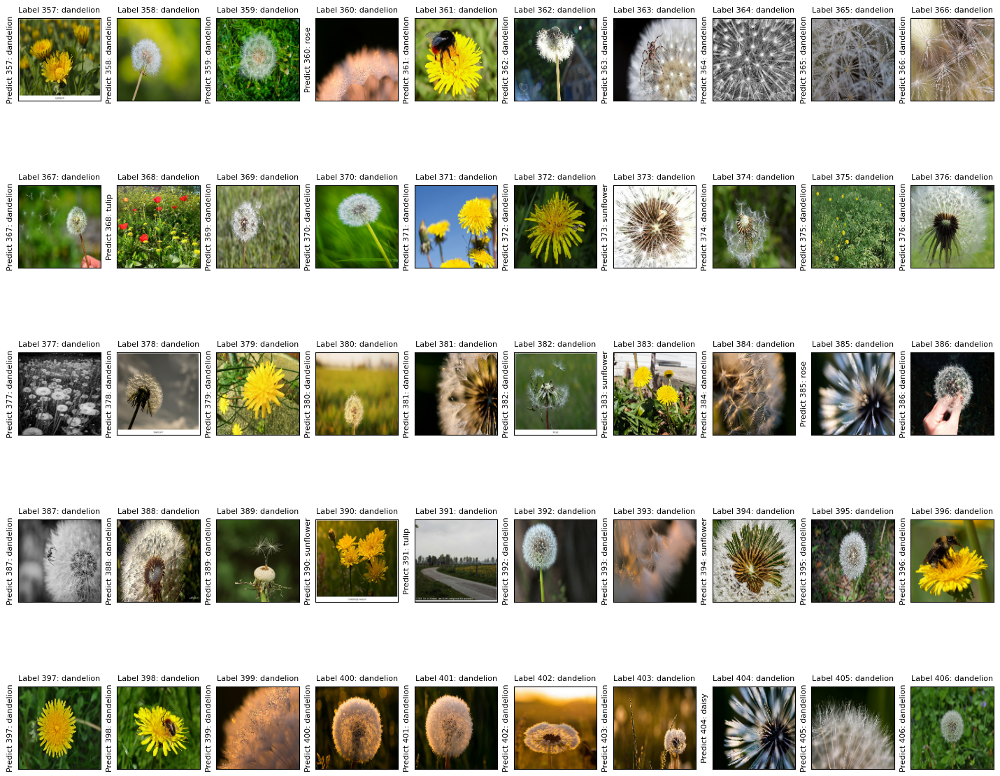

Kết quả dự đoán 50 hình dandelion của tệp kiểm thử
Độ chính xác dự đoán hoa dandelion của 50 hình tệp dữ liệu kiểm thử:  82.0 %


In [224]:
# 50 ảnh dandelion
fig = plt.figure(figsize=(18, 15))
columns = 10
rows = 5
index_type = Z_test_label_img.index('dandelion')
Z_test_label_dan = Z_test_label_img[index_type:index_type + 50]
y_pre_test_dan = []
for i in range(1, columns * rows + 1):
    fig.add_subplot(rows, columns, i)
    img = X_test_array_img[i+index_type]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('Label {}: {}'.format(i+index_type, Z_test_label_img[i+index_type]), fontdict={'fontsize':8} )
    plt.xticks([]) # bỏ tọa độ ở 2 trục
    plt.yticks([])
    y_pre_test_image = flower_pre_test[index_type+i]
    y_pre_test_dan.append(y_pre_test_image)
    plt.ylabel('Predict {}: {}'.format(i+index_type, y_pre_test_image), fontdict={'fontsize':8})
plt.show()
print('Kết quả dự đoán 50 hình dandelion của tệp kiểm thử')
accuracy_dan = 0
for i in range (0, len(Z_test_label_dan)):
    if Z_test_label_dan[i] == y_pre_test_dan[i]:
        accuracy_dan += 1
accuracy_dan = accuracy_dan/len(Z_test_label_dan)*100

print('Độ chính xác dự đoán hoa dandelion của 50 hình tệp dữ liệu kiểm thử: ', accuracy_dan, '%')

# Rose Test

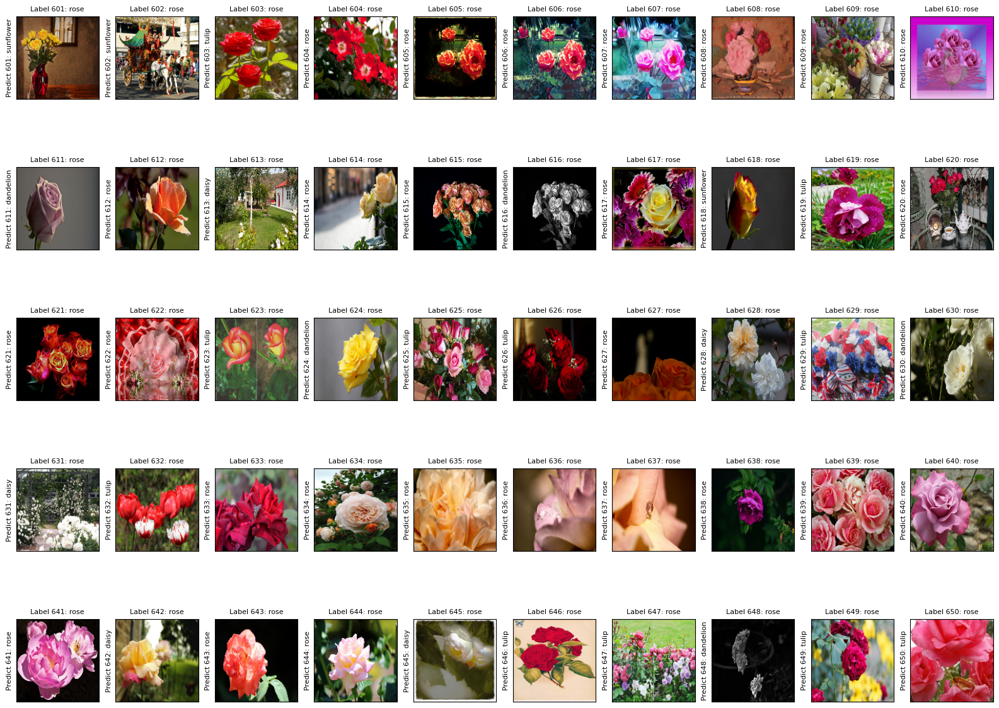

Kết quả dự đoán 50 hình rose của tệp kiểm thử
Độ chính xác dự đoán hoa rose của 50 hình tệp dữ liệu kiểm thử:  52.0 %


In [226]:

fig = plt.figure(figsize=(20, 15))
columns = 10
rows = 5
index_type = Z_test_label_img.index('rose')
Z_test_label_rose = Z_test_label_img[index_type:index_type + 50]
y_pre_test_rose = []
for i in range(1, columns * rows + 1):
    fig.add_subplot(rows, columns, i)
    img = X_test_array_img[i+index_type]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('Label {}: {}'.format(i+index_type, Z_test_label_img[i+index_type]), fontdict={'fontsize':8} )
    plt.xticks([]) # bỏ tọa độ ở 2 trục
    plt.yticks([])
    y_pre_test_image = flower_pre_test[index_type+i]
    y_pre_test_rose.append(y_pre_test_image)
    plt.ylabel('Predict {}: {}'.format(i+index_type, y_pre_test_image), fontdict={'fontsize':8})
plt.show()
print('Kết quả dự đoán 50 hình rose của tệp kiểm thử')
accuracy_rose = 0
for i in range (0, len(Z_test_label_rose)):
    if Z_test_label_rose[i] == y_pre_test_rose[i]:
        accuracy_rose += 1
accuracy_rose = accuracy_rose/len(Z_test_label_rose)*100

print('Độ chính xác dự đoán hoa rose của 50 hình tệp dữ liệu kiểm thử: ', accuracy_rose, '%')

# Sunflower Test

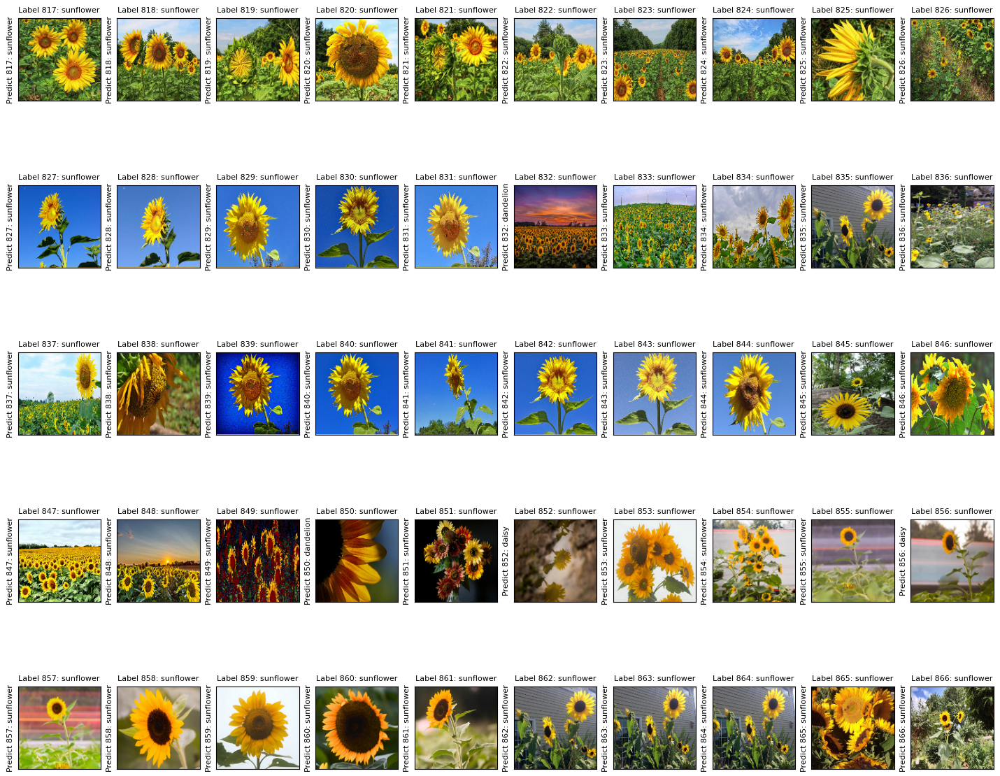

Kết quả dự đoán 50 hình sunflower của tệp kiểm thử
Độ chính xác dự đoán hoa sunflower của 50 hình tệp dữ liệu kiểm thử:  92.0 %


In [227]:

fig = plt.figure(figsize=(18, 15))
columns = 10
rows = 5
index_type = Z_test_label_img.index('sunflower')
Z_test_label_sunflower = Z_test_label_img[index_type:index_type + 50]
y_pre_test_sunflower = []
for i in range(1, columns * rows + 1):
    fig.add_subplot(rows, columns, i)
    img = X_test_array_img[i+index_type]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('Label {}: {}'.format(i+index_type, Z_test_label_img[i+index_type]), fontdict={'fontsize':8} )
    plt.xticks([]) # bỏ tọa độ ở 2 trục
    plt.yticks([])
    y_pre_test_image = flower_pre_test[index_type+i]
    y_pre_test_sunflower.append(y_pre_test_image)
    plt.ylabel('Predict {}: {}'.format(i+index_type, y_pre_test_image), fontdict={'fontsize':8})
plt.show()
print('Kết quả dự đoán 50 hình sunflower của tệp kiểm thử')
accuracy_sunflower = 0
for i in range (0, len(Z_test_label_sunflower)):
    if Z_test_label_sunflower[i] == y_pre_test_sunflower[i]:
        accuracy_sunflower += 1
accuracy_sunflower = accuracy_sunflower/len(Z_test_label_sunflower)*100

print('Độ chính xác dự đoán hoa sunflower của 50 hình tệp dữ liệu kiểm thử: ', accuracy_sunflower, '%')

# Tulip Test

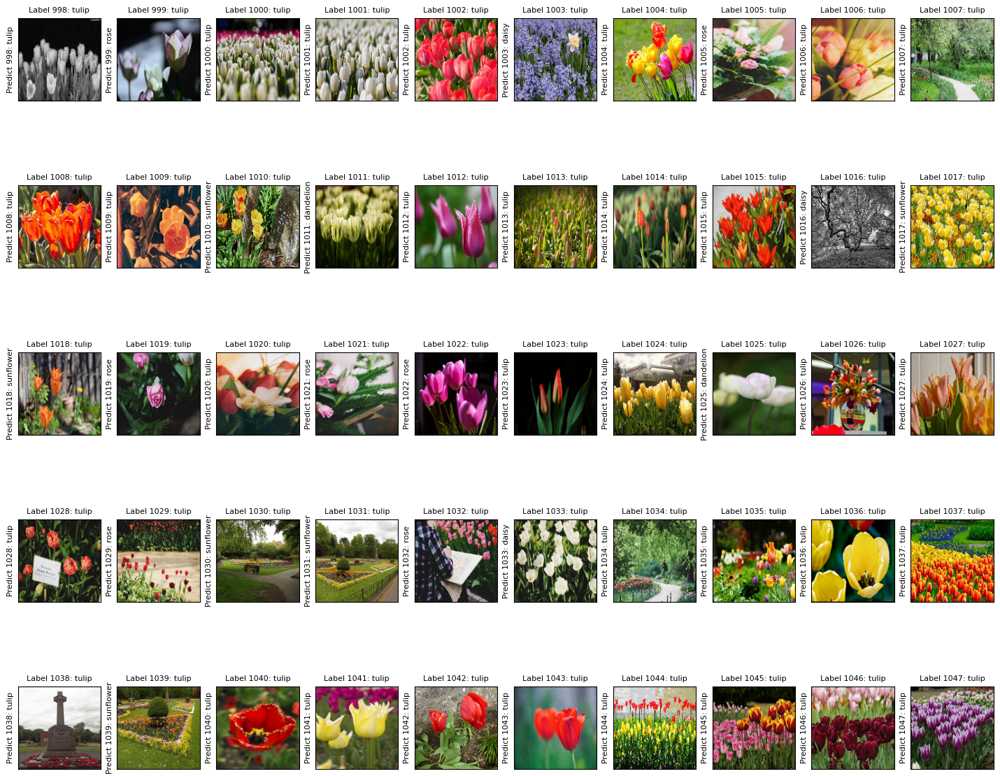

Kết quả dự đoán 50 hình tulip của tệp kiểm thử
Độ chính xác dự đoán hoa tulip của 50 hình tệp dữ liệu kiểm thử:  64.0 %


In [228]:
fig = plt.figure(figsize=(18, 15))
columns = 10
rows = 5
index_type = Z_test_label_img.index('tulip')
Z_test_label_tulip = Z_test_label_img[index_type:index_type + 50]
y_pre_test_tulip = []
for i in range(1, columns * rows + 1):
    fig.add_subplot(rows, columns, i)
    img = X_test_array_img[i+index_type]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('Label {}: {}'.format(i+index_type, Z_test_label_img[i+index_type]), fontdict={'fontsize':8} )
    plt.xticks([]) # bỏ tọa độ ở 2 trục
    plt.yticks([])
    y_pre_test_image = flower_pre_test[index_type+i]
    y_pre_test_tulip.append(y_pre_test_image)
    plt.ylabel('Predict {}: {}'.format(i+index_type, y_pre_test_image), fontdict={'fontsize':8})
plt.show()
print('Kết quả dự đoán 50 hình tulip của tệp kiểm thử')
accuracy_tulip = 0
for i in range (0, len(Z_test_label_tulip)):
    if Z_test_label_tulip[i] == y_pre_test_tulip[i]:
        accuracy_tulip += 1
accuracy_tulip = accuracy_tulip/len(Z_test_label_tulip)*100

print('Độ chính xác dự đoán hoa tulip của 50 hình tệp dữ liệu kiểm thử: ', accuracy_tulip, '%')

# Kiểm thử hình thực tế từ trên mạng

# Daisy Real:


4/4 [==============================] - 1s 116ms/step


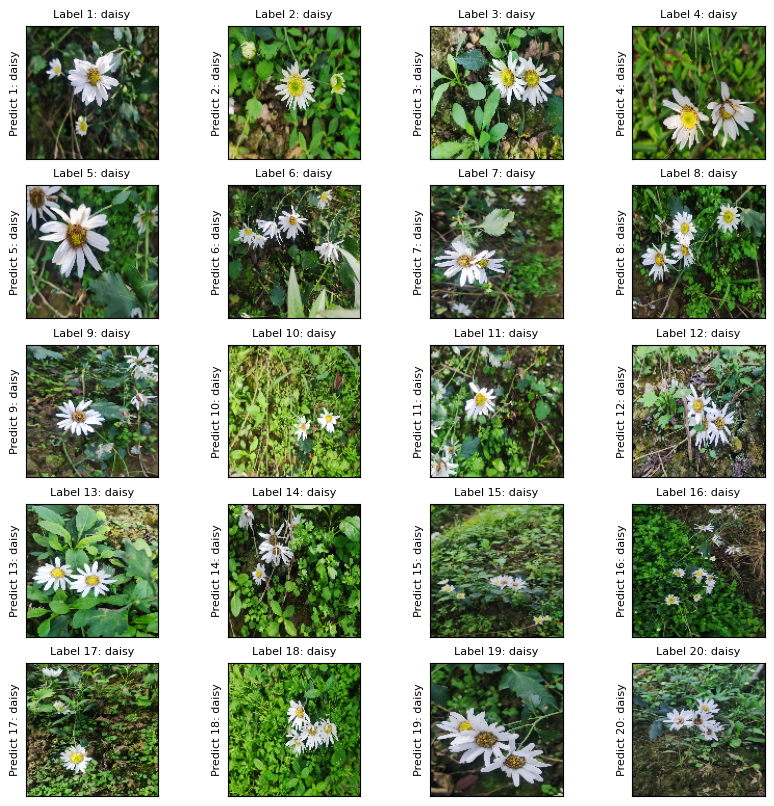

Kết quả dự đoán 20 hình daisy thực tế
Độ chính xác dự đoán hoa daisy của 20 hình thực tế:  100.0 %


In [209]:
# Kiểm thử lại với tệp dữ liệu huấn luyện
y_pre_real = model.predict(X_real)
predict_real = np.argmax(y_pre_real, axis=1) # trả về vị trí có giá trị max - loại hoa tại ảnh đó
# y_real
flower_pre_real = []
for i in predict_real:
    if i == 0:
        flower_pre_real.append('daisy')
    elif i == 1:
        flower_pre_real.append('dandelion')
    elif i == 2:
        flower_pre_real.append('rose')
    elif i == 3:
        flower_pre_real.append('sunflower')
    else:
        flower_pre_real.append('tulip')
# Sai số CE khi kiểm thử dữ liệu thực tế
Z_real_label_img
# Chuyển Z_real_label_img về số nguyên
Z_real_num = []
for i in Z_real_label_img:
    if i == 'daisy':
        Z_real_num.append(0)
    if i == 'dandelion':
        Z_real_num.append(1)
    if i == 'rose':
        Z_real_num.append(2)
    if i == 'sunflower':
        Z_real_num.append(3)
    if i == 'tulip':
        Z_real_num.append(4)
print(Z_real_num)
s_ce = 0
for j in range(0, len(y_pre_real)):
    s_ce += -np.log(y_pre_real[j][Z_real_num[j]])*1
print('Sai số CE mô hình dữ liệu thực tế: ', s_ce/100)

fig = plt.figure(figsize=(10, 10))
columns = 4
rows = 5
index_type = Z_real_label_img.index('daisy')
Z_real_label_daisy = Z_real_label_img[index_type:20]
y_pre_real_daisy = []
for i in range(1, columns * rows+1):
    fig.add_subplot(rows, columns, i)
    img = X_real_array_img[i-1]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('Label {}: {}'.format(i, Z_real_label_img[i-1]), fontdict={'fontsize':8} )
    plt.xticks([]) # bỏ tọa độ ở 2 trục
    plt.yticks([])
    y_pre_real_image = flower_pre_real[i-1]
    y_pre_real_daisy.append(y_pre_real_image)
    plt.ylabel('Predict {}: {}'.format(i, y_pre_real_image), fontdict={'fontsize':8})
plt.show()
print('Kết quả dự đoán 20 hình daisy thực tế')
accuracy_daisy = 0
for i in range (0, len(Z_real_label_daisy)):
    if Z_real_label_daisy[i] == y_pre_real_daisy[i]:
        accuracy_daisy += 1
accuracy_daisy = accuracy_daisy/len(Z_real_label_daisy)*100
print('Độ chính xác dự đoán hoa daisy của 20 hình thực tế: ', accuracy_daisy, '%')

In [230]:
real_accuracy = 0
for j in range (0, len(Z_real_label_img)):
    if Z_real_label_img[j] == flower_pre_real[j]:
        real_accuracy += 1
real_accuracy = real_accuracy/len(Z_real_label_img) * 100
print('Độ chính xác mô hình kiểm thử dữ liệu kiểm thử: ', real_accuracy, '%')

Độ chính xác mô hình kiểm thử dữ liệu kiểm thử:  75.0 %


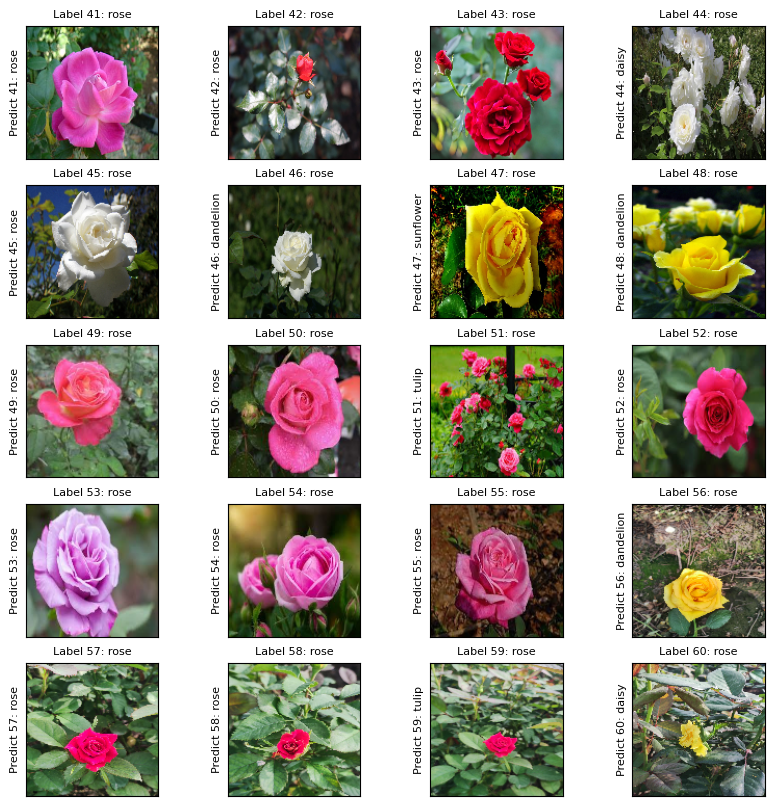

Kết quả dự đoán 20 hình rose thực tế
Độ chính xác dự đoán hoa rose của 20 hình thực tế:  60.0 %


In [210]:
fig = plt.figure(figsize=(10, 10))
columns = 4
rows = 5
index_type = Z_real_label_img.index('rose')
Z_real_label_rose = Z_real_label_img[index_type:index_type+20]
y_pre_real_rose = []
for i in range(1, columns * rows+1):
    fig.add_subplot(rows, columns, i)
    img = X_real_array_img[i-1 + index_type]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('Label {}: {}'.format(i+index_type, Z_real_label_img[i-1+index_type]), fontdict={'fontsize':8} )
    plt.xticks([]) # bỏ tọa độ ở 2 trục
    plt.yticks([])
    y_pre_real_image = flower_pre_real[i-1+index_type]
    y_pre_real_rose.append(y_pre_real_image)
    plt.ylabel('Predict {}: {}'.format(i+index_type, y_pre_real_image), fontdict={'fontsize':8})
plt.show()
print('Kết quả dự đoán 20 hình rose thực tế')
accuracy_rose = 0
for i in range (0, len(Z_real_label_rose)):
    if Z_real_label_rose[i] == y_pre_real_rose[i]:
        accuracy_rose += 1
accuracy_rose = accuracy_rose/len(Z_real_label_rose)*100
print('Độ chính xác dự đoán hoa rose của 20 hình thực tế: ', accuracy_rose, '%')

# Dandelion Real

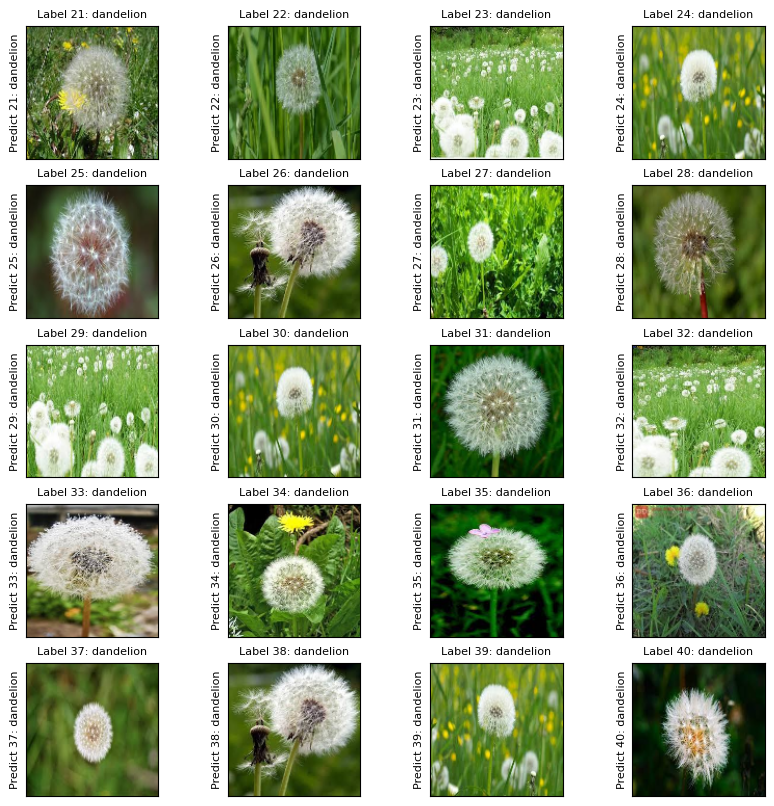

Kết quả dự đoán 20 hình dandelion thực tế
Độ chính xác dự đoán hoa dandelion của 20 hình thực tế:  100.0 %


In [211]:
fig = plt.figure(figsize=(10, 10))
columns = 4
rows = 5
index_type = Z_real_label_img.index('dandelion')
Z_real_label_dandelion = Z_real_label_img[index_type:index_type+20]
y_pre_real_dandelion = []
for i in range(1, columns * rows+1):
    fig.add_subplot(rows, columns, i)
    img = X_real_array_img[i-1 + index_type]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('Label {}: {}'.format(i+index_type, Z_real_label_img[i-1+index_type]), fontdict={'fontsize':8} )
    plt.xticks([]) # bỏ tọa độ ở 2 trục
    plt.yticks([])
    y_pre_real_image = flower_pre_real[i-1+index_type]
    y_pre_real_dandelion.append(y_pre_real_image)
    plt.ylabel('Predict {}: {}'.format(i+index_type, y_pre_real_image), fontdict={'fontsize':8})
plt.show()
print('Kết quả dự đoán 20 hình dandelion thực tế')
accuracy_dandelion = 0
for i in range (0, len(Z_real_label_dandelion)):
    if Z_real_label_dandelion[i] == y_pre_real_dandelion[i]:
        accuracy_dandelion += 1
accuracy_dandelion = accuracy_dandelion/len(Z_real_label_dandelion)*100
print('Độ chính xác dự đoán hoa dandelion của 20 hình thực tế: ', accuracy_dandelion, '%')

# Sunflower Real

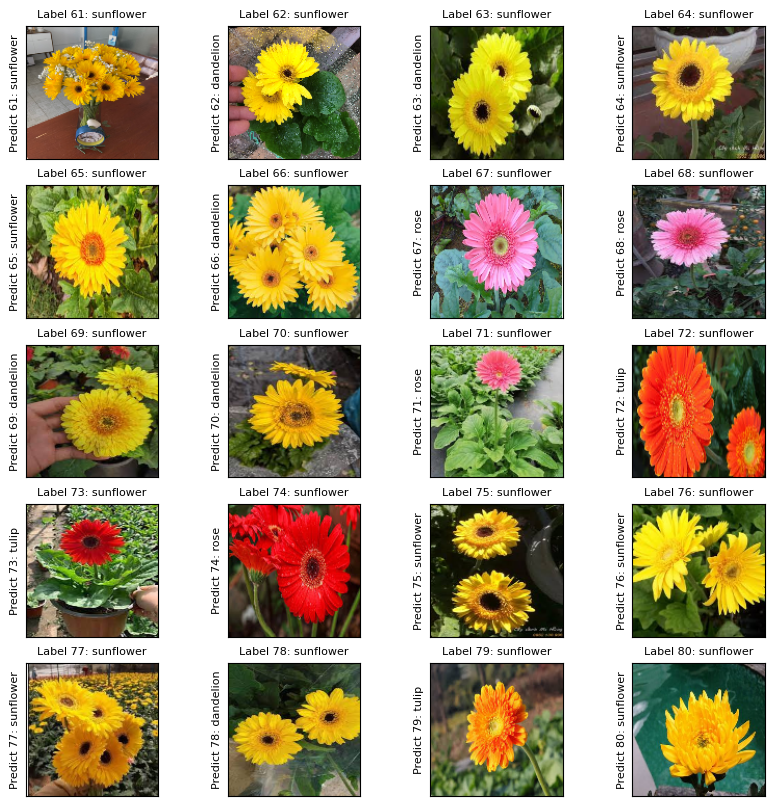

Kết quả dự đoán 20 hình sunflower thực tế
Độ chính xác dự đoán hoa sunflower của 20 hình thực tế:  35.0 %


In [212]:
fig = plt.figure(figsize=(10, 10))
columns = 4
rows = 5
index_type = Z_real_label_img.index('sunflower')
Z_real_label_sunflower = Z_real_label_img[index_type:index_type+20]
y_pre_real_sunflower = []
for i in range(1, columns * rows+1):
    fig.add_subplot(rows, columns, i)
    img = X_real_array_img[i-1 + index_type]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('Label {}: {}'.format(i+index_type, Z_real_label_img[i-1+index_type]), fontdict={'fontsize':8} )
    plt.xticks([]) # bỏ tọa độ ở 2 trục
    plt.yticks([])
    y_pre_real_image = flower_pre_real[i-1+index_type]
    y_pre_real_sunflower.append(y_pre_real_image)
    plt.ylabel('Predict {}: {}'.format(i+index_type, y_pre_real_image), fontdict={'fontsize':8})
plt.show()
print('Kết quả dự đoán 20 hình sunflower thực tế')
accuracy_sunflower = 0
for i in range (0, len(Z_real_label_sunflower)):
    if Z_real_label_sunflower[i] == y_pre_real_sunflower[i]:
        accuracy_sunflower += 1
accuracy_sunflower = accuracy_sunflower/len(Z_real_label_sunflower)*100
print('Độ chính xác dự đoán hoa sunflower của 20 hình thực tế: ', accuracy_sunflower, '%')

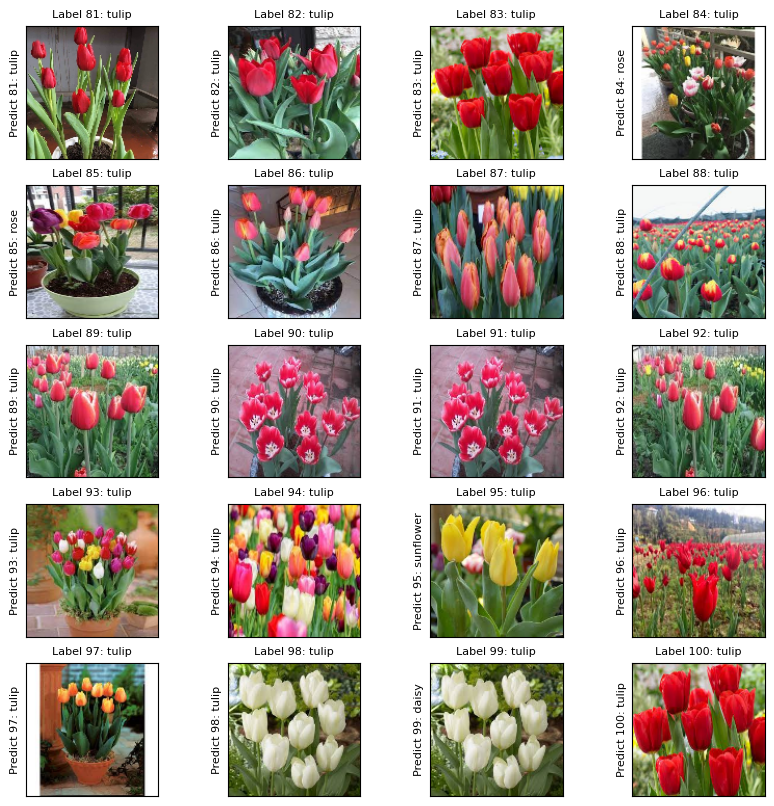

Kết quả dự đoán 20 hình tulip thực tế
Độ chính xác dự đoán hoa tulip của 20 hình thực tế:  80.0 %


In [214]:
fig = plt.figure(figsize=(10, 10))
columns = 4
rows = 5
index_type = Z_real_label_img.index('tulip')
Z_real_label_tulip = Z_real_label_img[index_type:index_type+20]
y_pre_real_tulip = []
for i in range(1, columns * rows+1):
    fig.add_subplot(rows, columns, i)
    img = X_real_array_img[i-1 + index_type]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('Label {}: {}'.format(i+index_type, Z_real_label_img[i-1+index_type]), fontdict={'fontsize':8} )
    plt.xticks([]) # bỏ tọa độ ở 2 trục
    plt.yticks([])
    y_pre_real_image = flower_pre_real[i-1+index_type]
    y_pre_real_tulip.append(y_pre_real_image)
    plt.ylabel('Predict {}: {}'.format(i+index_type, y_pre_real_image), fontdict={'fontsize':8})
plt.show()
print('Kết quả dự đoán 20 hình tulip thực tế')
accuracy_tulip = 0
for i in range (0, len(Z_real_label_tulip)):
    if Z_real_label_tulip[i] == y_pre_real_tulip[i]:
        accuracy_tulip += 1
accuracy_tulip = accuracy_tulip/len(Z_real_label_tulip)*100
print('Độ chính xác dự đoán hoa tulip của 20 hình thực tế: ', accuracy_tulip, '%')


# Đánh giá

Text(0.5, 1.0, 'Sai số (Loss) khi huấn luyện')

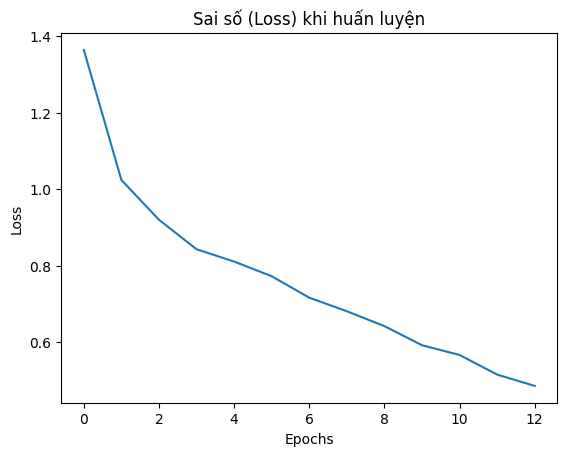

In [216]:
#Danh sách epoch - độ chính xác:  {10: 70.28, 11: 73.98, 12: 70.0, 13: 73.52, 14: 73.52, 15: 74.26, 16: 76.02, 17: 74.81, 18: 74.54, 19: 74.63, 20: 73.89, 21: 76.76, 22: 75.46, 23: 73.33, 24: 74.63, 25: 74.81, 26: 74.63, 27: 75.83, 28: 75.28, 29: 75.19}


plt.plot(History.history['loss'])
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Sai số (Loss) khi huấn luyện')

Text(0.5, 1.0, 'Độ chính xác (Accuracy) khi mô hình huấn luyện')

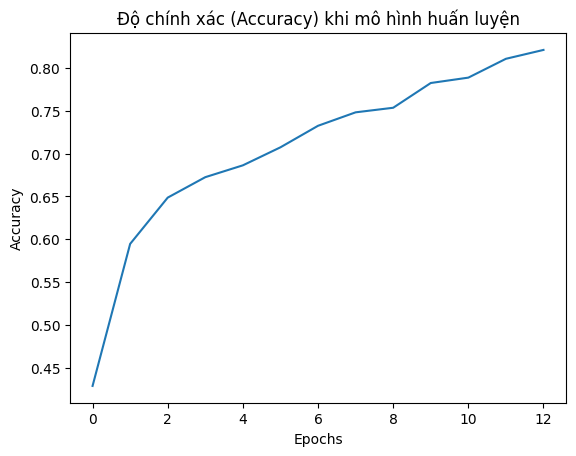

In [217]:
plt.plot(History.history['accuracy'])

plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Độ chính xác (Accuracy) khi mô hình huấn luyện')

Text(0.5, 1.0, 'Sai số (Loss) khi mô hình kiểm thử dữ liệu test')

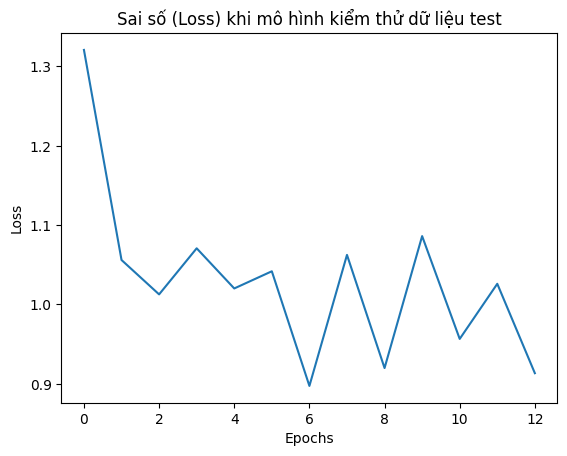

In [220]:
plt.plot(History.history['val_loss'])

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Sai số (Loss) khi mô hình kiểm thử dữ liệu test')

Text(0.5, 1.0, 'Độ chính xác (val_accuracy) khi mô hình kiểm thử dữ liệu test')

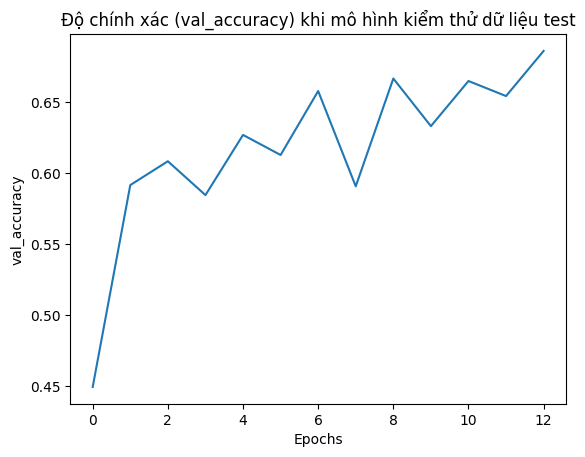

In [219]:
plt.plot(History.history['val_accuracy'])

plt.xlabel('Epochs')
plt.ylabel('val_accuracy')
plt.title('Độ chính xác (val_accuracy) khi mô hình kiểm thử dữ liệu test')